# Cell type deconvolution for spatial transcriptomics
This pipeline is adjusted from the tutorial [here](https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html).

## Prepare pipeline environment
To run this pipline, we recommend to use the docker contianer (https://cell2location.readthedocs.io/en/latest/dockersingularity.html) built by the cell2location developer. That page describes how to run the pipeline using docker. If you are using HPC, then it's recommended to run this pipeline using singularity. You can download the docker image using singularity with the command: <br/> 
> **singularity pull docker://quay.io/vitkl/cell2location:latest**. <br/>

Singularity image file is not writable, you can transfer it to a sandbox and then you will be able to install packages inside it without administrator role. The commands are:
> singularity build --sandbox cell2location cell2location.sif <br/>
> singularity run -w cell2location jupyter-lab --no-home --no-browser --port 8888

In the end, you can open jupyter-lab by copying and pasting the url shown in terminal.

# Load Packages

In [5]:
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import scanorama

import cell2location
import scvi
import glob
import os
import math
import sys

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text for PDFs
plt.style.use('ggplot')

sys.path.insert(1, os.path.join(sys.path[0], '..'))
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.1 numpy==1.21.2 scipy==1.7.1 pandas==1.3.2 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.6 louvain==0.7.0 pynndescent==0.5.4


In [6]:
import importlib
import utils.visium_modules as vis
importlib.reload(vis)

<module 'utils.visium_modules' from '/media/home/lis262/Code/scRNASeq_spatial/spatial_pipeline/projects/../utils/visium_modules.py'>

In [7]:
path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf'
work_path = f'{path}/p02_visium_20230308/Analysis'
# define result folder
results_folder = f'{path}/r02_cell2location/'
# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map_batch2'
os.makedirs(run_name, exist_ok=True)

# 1. Preprocessing
## 1.1 Read Data
### 1.1.1 read spatial data
* read in data, normalize, get highly variable genes
* change index to ensemble id to make sure spatial and reference scRNAseq can map gene perfectly
* remove mitochondria genes which are irrelevant for spatial mapping because their expression represents technical artifacts in the single cell and nucleus data rather than biological abundance of mitochondria. Yet these genes compose 15-40% of mRNA in each location.

In [8]:
path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf'
work_path = f'{path}/p02_visium_20230308/Analysis'
raw_path = f'{work_path}/f01_raw'
file_pres = [f for f in sorted(glob.glob(f'{raw_path}/*')) if os.path.isdir(f)]

adata_list, samples = vis.get_adata_list(file_pres)
vis.norm_hv_gene(adata_list)
vis.rm_mt_genes(adata_list)
vis.use_geneid_as_index(adata_list)

/opt/conda/envs/cellpymc/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


### 1.2.2 Clustering and UMAP
Using leiden method on scanorama embeddings

In [9]:
adata_scano = sc.read_h5ad(f'{work_path}/f02_inter_h5ad/cirr_norm.h5ad')

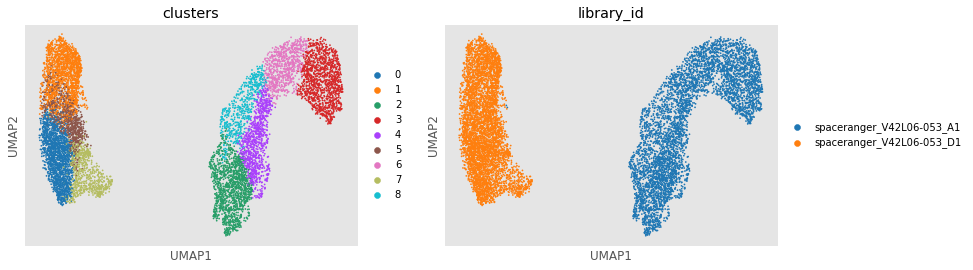

In [10]:
sc.pl.umap(adata_scano, color=["clusters", "library_id"], palette=sc.pl.palettes.default_20)

In [11]:
clusters_colors = dict(zip([str(i) for i in range(18)], adata_scano.uns["clusters_colors"]))

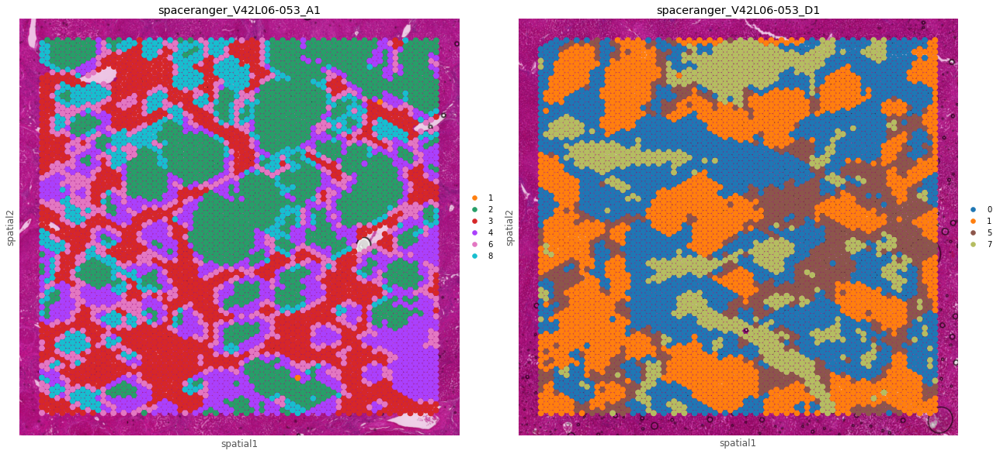

In [8]:
fig, axs = plt.subplots(1, len(adata_scano.obs['sample'].cat.categories), figsize=(18, 10))

for i, library in enumerate(adata_scano.uns['spatial'].keys()):
    ad = adata_scano[adata_scano.obs.library_id == library, :].copy()
    sc.pl.spatial(ad, img_key="hires", library_id=library, color="clusters", size=1.5,title=library,
                  palette=[v for k, v in clusters_colors.items() if k in ad.obs.clusters.unique().tolist()],
        show=False, ax=axs[i])
plt.tight_layout()

### 1.2.3 Change array back to raw count for cell2location

In [12]:
for ad in adata_list:
    ad.X =ad.layers['counts'].copy()

In [13]:
adata_spatial = sc.concat(adata_list, label="library_id", uns_merge="unique",merge='same',
    keys=[k for d in [ad.uns['spatial'] for ad in adata_list] for k, v in d.items()], index_unique="-",)
adata_spatial.raw = adata_spatial

In [14]:
adata_spatial.obs = pd.merge(adata_spatial.obs, adata_scano.obs['clusters'].to_frame(), left_index=True, right_index=True)

## 1.2 Read scRNASeq data
Need to change index Ensembl gene id to make sure the index can match perfectly between scRNASeq and spatial data

In [9]:
sc_fn = f'{path}/r01_ref_scrna/liver_cirrohtic/liver_anno_ct.h5ad'
adata_ref = sc.read(sc_fn)
print('cell by gene:', adata_ref.shape)

cell by gene: (46953, 33694)


In [13]:
adata_ref.var['SYMBOL'] = adata_ref.var.index
# rename 'gene_ids' as necessary for your data
adata_ref.var.set_index('gene_ids', drop=True, inplace=True)
# delete unnecessary raw slot (to be removed in a future version of the tutorial)
# del adata_ref.raw

### 1.2.1 Filter genes
The anndata object for reference structure is: adata.X and adata.raw has log normalized data. adata.layers['counts'] has raw count. The selection step uses raw count data, so we need to copy the raw count data to adata.X
Select markers for each cell type. If the reference data is harmanized data, then probably should skip this step, because the values are batch corrected data.

/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


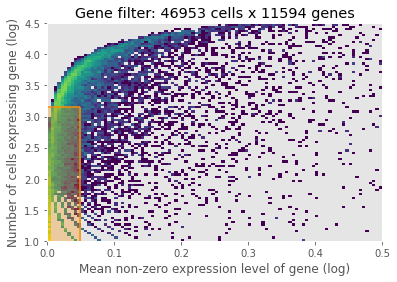

n_genes before filtering: 33694
n_genes after filtering: 11594


In [14]:
from cell2location.utils.filtering import filter_genes
adata_ref.X = adata_ref.layers['counts'].copy()
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# filter the object
print('n_genes before filtering:', adata_ref.shape[1])
adata_ref = adata_ref[:, selected].copy()
print('n_genes after filtering:', adata_ref.shape[1])

# 2 Estimation of reference cell type signatures (NB regression)

## !!! Attention, if you have alreadly run this step before and have the model and h5ad file ready, skip to step 3.

## 2.1 Prepare data for regression

In [112]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
        # 10X reaction / sample / batch
        batch_key='sample',
        # cell type, covariate used for constructing signatures
        labels_key='final_celltype',
        # multiplicative technical effects (platform, 3' vs 5', donor effect)
        categorical_covariate_keys=['specimen_from_organism.diseases']
       )

## 2.2 Create the regression model

In [113]:
# create the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.17.4.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': 'final_celltype',
│   'categorical_covariate_keys': ['specimen_from_organism.diseases'],
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 11594 │
│         n_cells          │ 46953 │
│         n_batch          │  20   │
│         n_labels         │  12   │
│ n_extra_categorical_covs │   1   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │                  adata.X                   │
│         batch          │          adata.obs['_scvi_batch']          │
│         labels         │         adata.obs['_scvi_labels']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         ind_x          │           adata.obs['_indices']            │
└────────────────────────┴────────────────────────────────────────────┘

                            batch State Registry                            
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃          Categories          ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │  GSM4041150_healthy1_cd45+   │          0          │
│                     │  GSM4041151_healthy1_cd45-A  │          1          │
│                     │  GSM4041152_healthy1_cd45-B  │          2          │
│                     │  GSM4041153_healthy2_cd45+   │          3          │
│                     │  GSM4041154_healthy2_cd45-   │          4          │
│                     │  GSM4041155_healthy3_cd45+   │          5          │
│                     │  GSM4041156_healthy3_cd45-A  │          6          │
│                     │  GSM4041157_healthy3_cd45-B  │          7          │
│                     │  GSM4041158_healthy4_cd45+   │          8          │
│                     │  GSM4041159_healthy4_cd45-   │          9          │
│                     │  GSM4041160_healthy5_cd45+   │         10          │
│                     │ GSM4041161_cirrhotic1_cd45+  │         11          │
│                     │ GSM4041162_cirrhotic1_cd45-A │         12          │
│                     │ GSM4041163_cirrhotic1_cd45-B │         13          │
│                     │ GSM4041164_cirrhotic2_cd45+  │         14          │
│                     │ GSM4041165_cirrhotic2_cd45-  │         15          │
│                     │ GSM4041166_cirrhotic3_cd45+  │         16          │
│                     │ GSM4041167_cirrhotic3_cd45-  │         17          │
│                     │ GSM4041168_cirrhotic4_cd45+  │         18          │
│                     │ GSM4041169_cirrhotic5_cd45+  │         19          │
└─────────────────────┴──────────────────────────────┴─────────────────────┘

                      labels State Registry                       
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃       Source Location       ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['final_celltype'] │   B cell   │          0          │
│                             │   CD8+_T   │          1          │
│                             │    Endo    │          2          │
│                             │ Hepatocyte │          3          │
│                             │    ILC     │          4          │
│                             │     MP     │          5          │
│                             │    Mes     │          6          │
│                             │    NKT     │          7          │
│                             │   Plasma   │          8          │
│                             │    TNK     │          9          │
│                             │    Treg    │         10          │
│                             │    pDC     │         11          │
└─────────────────────────────┴────────────┴─────────────────────┘

                                  extra_categorical_covs State Registry                                   
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃               Source Location                ┃            Categories             ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['specimen_from_organism.diseases'] │   alcoholic fatty liver disease   │          0          │
│                                              │ non-alcoholic fatty liver disease │          1          │
│                                              │              normal               │          2          │
│                                              │    primary biliary cholangitis    │          3          │
│                                              │                                   │                     │
└──────────────────────────────────────────────┴───────────────────────────────────┴─────────────────────┘

## 2.3 Train the model

In [114]:
mod.train(max_epochs=250, use_gpu=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Epoch 250/250: 100%|█| 250/250 [09:44<00:00,  2.35s/it, v_num=1, elbo_train=2.19

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|█| 250/250 [09:45<00:00,  2.34s/it, v_num=1, elbo_train=2.19


Here, we plot ELBO loss history during training, removing first 20 epochs from the plot. This plot should have a decreasing trend and level off by the end of training. If it is still decreasing, increase max_epochs

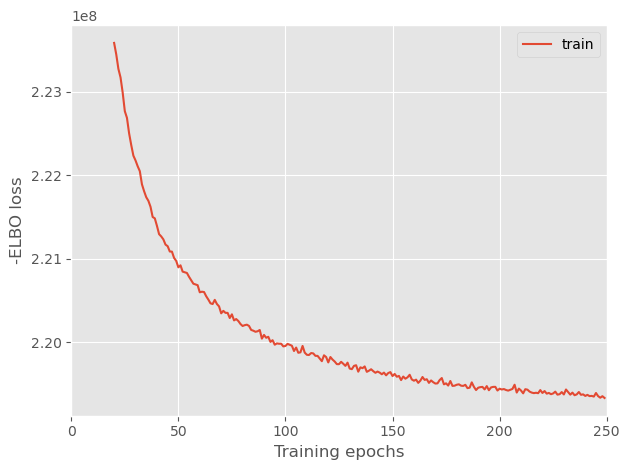

In [115]:
mod.plot_history(20)

In [116]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc_new_anno.h5ad"
adata_ref.write(adata_file)
print(adata_file)

Sampling global variables, sample: 100%|██████| 999/999 [00:13<00:00, 74.32it/s]
/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//reference_signatures/sc_new_anno.h5ad


Examine QC plots.

Reconstruction accuracy to assess if there are any issues with inference. This 2D histogram plot should have most observations along a noisy diagonal.

The estimated expression signatures are distinct from mean expression in each cluster because of batch effects. For scRNA-seq datasets which do not suffer from batch effect (this dataset does), cluster average expression can be used instead of estimating signatures with a model. When this plot is very different from a diagonal plot (e.g. very low values on Y-axis, density everywhere) it indicates problems with signature estimation.

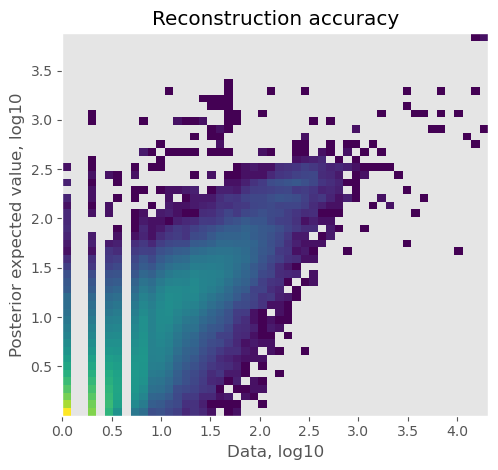

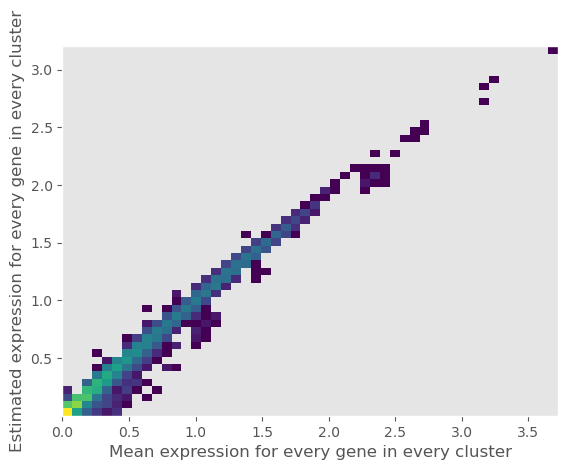

In [117]:
mod.plot_QC()

# 3. Load pre-existing model and anndata h5ad file
## !!! If you have run step 2 then skip this step

In [17]:
# load data and reference
adata_file = f"{ref_run_name}/sc_new_anno.h5ad"
adata_ref = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", adata_ref)

INFO     File                                                                                                      
         /media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//reference_signature
         s/model.pt already downloaded                                                                             


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")


Epoch 1/426:   0%| | 1/426 [00:09<1:05:44,  9.28s/it, v_num=1, elbo_train=2.36e+

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/426:   0%| | 1/426 [00:09<1:05:48,  9.29s/it, v_num=1, elbo_train=2.36e+


# 4. Deconvolution

## 4.1 Extract signature gene expression
All parameters of the a Negative Binomial regression model are exported into reference anndata object, however for spatial mapping we just need the estimated expression of every gene in every cell type. Here we extract that from standard output:

In [16]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, :]

,B cell,CD8+_T,Endo,Hepatocyte,ILC,MP,Mes,NKT,Plasma,TNK,Treg,pDC
gene_ids,,,,,,,,,,,,
ENSG00000279457,0.061922,0.075825,0.141086,0.260469,0.075961,0.168089,0.249468,0.122451,0.130759,0.067208,0.061569,0.175021
ENSG00000228463,0.055507,0.050226,0.148398,0.152235,0.056957,0.128298,0.302487,0.059703,0.075500,0.051561,0.054968,0.096489
ENSG00000237491,0.022931,0.015462,0.018983,0.035169,0.016974,0.046900,0.080090,0.021596,0.064612,0.016968,0.012685,0.015210
ENSG00000187634,0.000638,0.000528,0.017511,0.002401,0.000280,0.000474,0.100021,0.047395,0.010790,0.000291,0.000857,0.003245
ENSG00000188976,0.090891,0.091460,0.159502,0.228929,0.105643,0.128017,0.158814,0.134335,0.232998,0.088961,0.098387,0.179448


## 4.2 Spatial mapping
Find shared genes and prepare anndata. Subset both anndata and reference signatures:

In [17]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_spatial.var_names, inf_aver.index)
adata_spatial = adata_spatial[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_spatial, batch_key="library_id")

Important
To use cell2location spatial mapping model, you need to specify 2 user-provided hyperparameters (N_cells_per_location and detection_alpha) - for detailed guidance on setting these hyperparameters and their impact see the flow diagram and the note.

In [18]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_spatial, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.17.4.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'library_id',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 10362 │
│         n_cells          │ 9948  │
│         n_batch          │   2   │
│         n_labels         │   1   │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
│    ind_x     │   adata.obs['_indices']   │
└──────────────┴───────────────────────────┘

                            batch State Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location     ┃        Categories         ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['library_id'] │ spaceranger_V42L06-053_A1 │          0          │
│                         │ spaceranger_V42L06-053_D1 │          1          │
└─────────────────────────┴───────────────────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1896: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  category=PossibleUserWarning,


Epoch 5843/30000:  19%|▏| 5842/30000 [3:03:55<16:40:34,  2.49s/it, v_num=1, elbo

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 13250/30000:  44%|▍| 13249/30000 [7:55:12<17:27:38,  3.75s/it, v_num=1, el

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 16664/30000:  56%|▌| 16663/30000 [10:58:02<5:41:04,  1.53s/it, v_num=1, el

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 20236/30000:  67%|▋| 20236/30000 [12:37:18<4:09:52,  1.54s/it, v_num=1, el

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 23801/30000:  79%|▊| 23800/30000 [14:15:16<2:39:22,  1.54s/it, v_num=1, el

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 27358/30000:  91%|▉| 27357/30000 [15:51:38<1:07:46,  1.54s/it, v_num=1, el

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 30000/30000: 100%|█| 30000/30000 [17:03:37<00:00,  2.31s/it, v_num=1, elbo

`Trainer.fit` stopped: `max_epochs=30000` reached.


Epoch 30000/30000: 100%|█| 30000/30000 [17:03:37<00:00,  2.05s/it, v_num=1, elbo


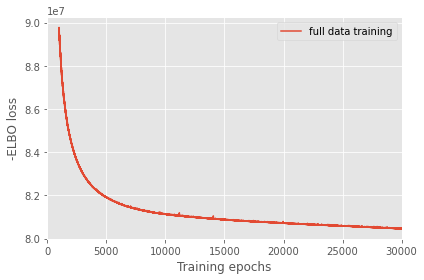

In [19]:
mod.train(max_epochs=30000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          use_gpu=False)

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

Exporting estimated posterior distributions of cell abundance and saving results:

In [21]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_spatial = mod.export_posterior(
    adata_spatial, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': False}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp_new_anno.h5ad"
adata_spatial.write(adata_file)
print(adata_file)

Sampling global variables, sample: 100%|██████| 999/999 [06:39<00:00,  2.50it/s]
/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//cell2location_map_batch2/sp_new_anno.h5ad


# 5. Load trained mapping model
## !!! If you have run step 4, skip this loading step

In [18]:
# to load the known data
adata_file = f"{run_name}/sp_new_anno.h5ad"
adata_spatial = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_spatial)

INFO     File                                                                                                      
         /media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//cell2location_map_b
         atch2/model.pt already downloaded                                                                         


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:105: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1896: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  category=PossibleUserWarning,


Epoch 1/30000:   0%| | 1/30000 [00:02<23:02:04,  2.76s/it, v_num=1, elbo_train=2

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/30000:   0%| | 1/30000 [00:02<23:04:52,  2.77s/it, v_num=1, elbo_train=2


In [ ]:
mod.export_posterior(adata_spatial)
mod.plot_QC()

Sampling local variables, batch:  23%|█▊      | 18/78 [22:43<1:12:52, 72.88s/it]

When intergrating multiple spatial batches and when working with datasets that have substantial variation of detected RNA within slides (that cannot be explained by high cellular density in the histology), it is important to assess whether cell2location normalised those effects. You expect to see similar total cell abundance across batches but distinct RNA detection sensitivity (both estimated by cell2location). You expect total cell abundance to mirror high cellular density in the histology.

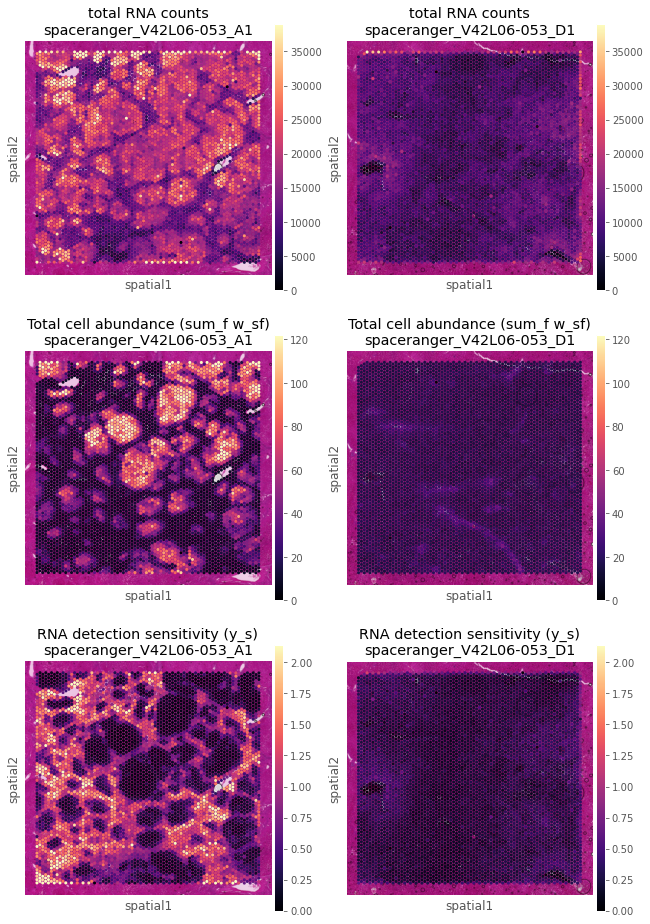

In [31]:
fig = mod.plot_spatial_QC_across_batches()

# 6. Visualizing cell abundance in spatial coordinates
## 6.1 Cell type abundance visualize
We use 5% quantile of the posterior distribution, representing the value of cell abundance that the model has high confidence in (aka ‘at least this amount is present’).

In [35]:
adata_spatial.obs['library_id'].unique()

['spaceranger_V42L06-053_A1', 'spaceranger_V42L06-053_D1']
Categories (2, object): ['spaceranger_V42L06-053_A1', 'spaceranger_V42L06-053_D1']

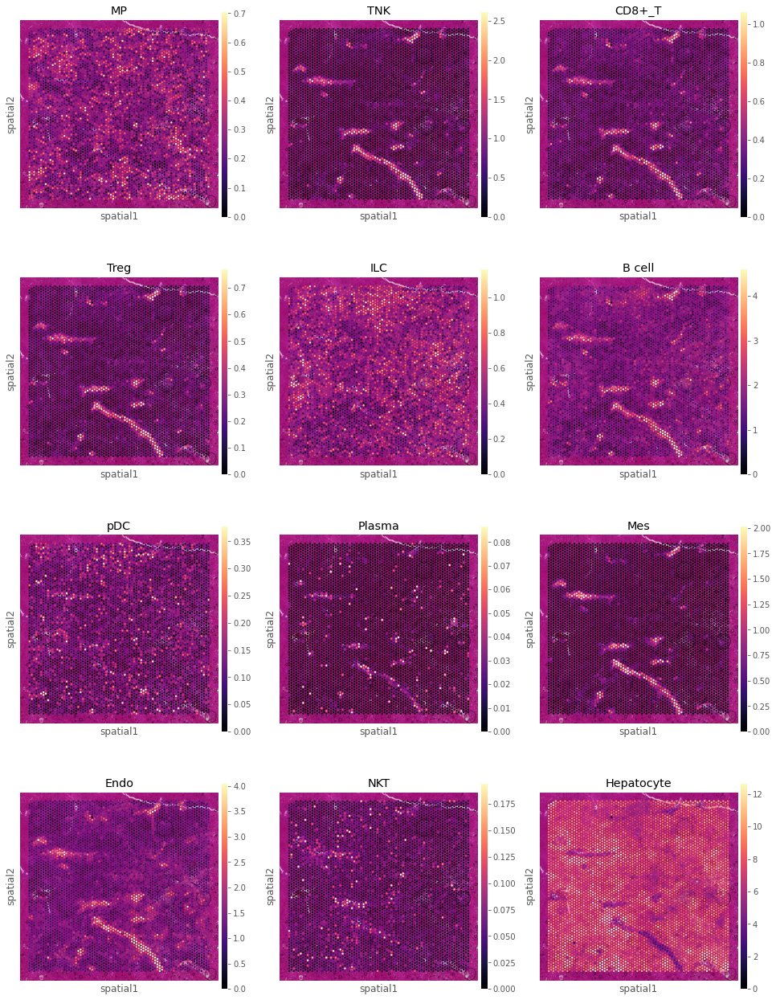

In [36]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_spatial.obs[adata_spatial.uns['mod']['factor_names']] = adata_spatial.obsm['q05_cell_abundance_w_sf']

# select one slide
from cell2location.utils import select_slide
slide = select_slide(adata_spatial, 'spaceranger_V42L06-053_D1', batch_key='library_id')

cells = adata_ref.obs['final_celltype'].unique().tolist()
# plot in spatial coordinates
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(slide, cmap='magma',
                  # show first 8 cell types
                  color=cells,
                  ncols=3, size=1,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2'
                 )

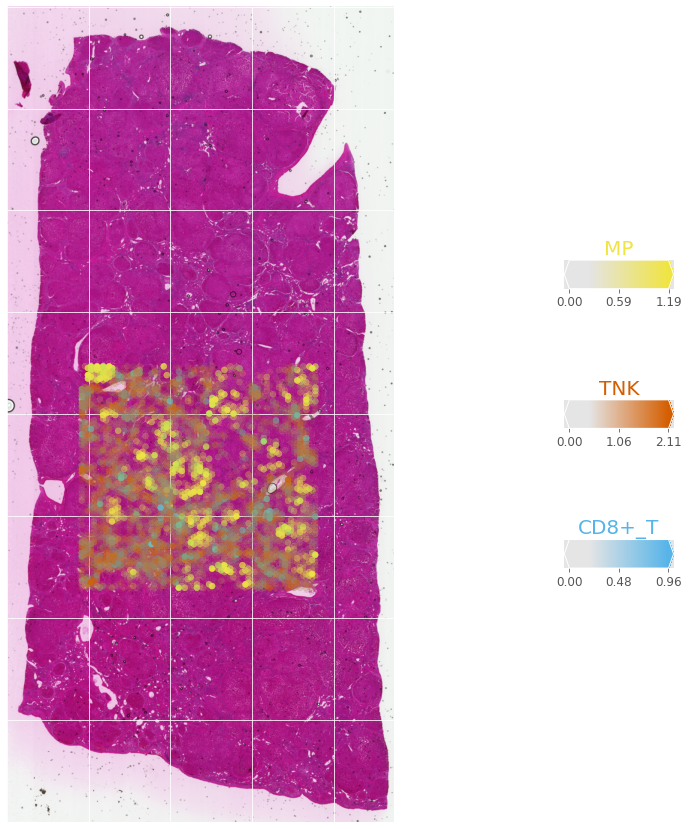

In [22]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial

# select up to 6 clusters
cells = adata_ref.obs['final_celltype'].unique().tolist()

clust_labels = cells[:3]
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

slide = select_slide(adata_spatial, 'spaceranger_V42L06-053_A1', batch_key='library_id')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        colorbar_position='right'
    )

## 6.2 Cell abundance in each cluster region

In [26]:
# calculate cell portion at each spot
cells = adata_ref.obs['final_celltype'].unique().tolist()
adata_spatial.obs['q05_total_abun'] = adata_spatial.obs[cells].sum(axis=1)
for c in cells:
    adata_spatial.obs[f'{c}_portion'] = adata_spatial.obs[c] / adata_spatial.obs['q05_total_abun']

In [28]:
sample = 'spaceranger_V42L06-053_A1'
adata_spatial.obs.query('library_id == @sample')['clusters'].value_counts()

2    1378
3    1265
4     993
6     764
8     557
1       2
0       0
5       0
7       0
Name: clusters, dtype: int64

Text(0.5, 0.05, 'Cell portion')

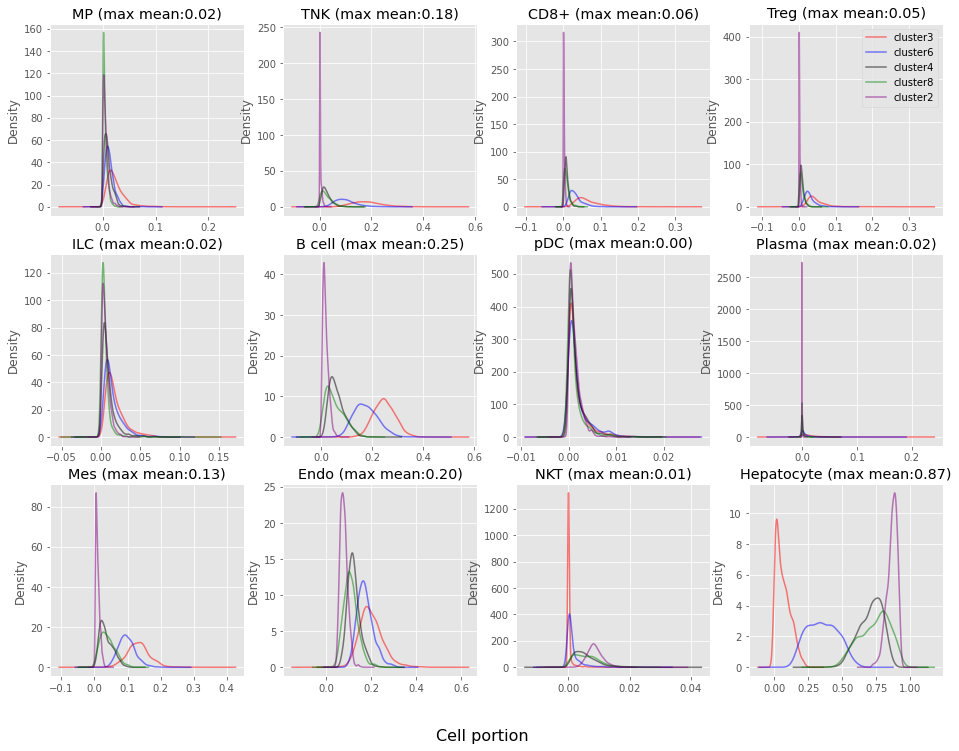

In [29]:
n = len(cells)
ncol = 4
nrow = math.ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(16,12))

sample = 'spaceranger_V42L06-053_A1'
cell_cols = [f'{c}_portion' for c in cells]
clusts = ['3','6','4','8','2']
colors = ['red','blue','black','green','purple']

max_mean_dict = {k:0 for k in cell_cols}
for clust, color in zip(clusts, colors):
    df = adata_spatial.obs.query('library_id == @sample and clusters==@clust')[cell_cols].copy()
    mean_dict = df.mean().to_dict()
    for k in max_mean_dict.keys(): 
        if max_mean_dict[k] < mean_dict[k]:
            max_mean_dict[k] = mean_dict[k]
    for i in range(len(cells)):
        row = i // ncol
        col = i % ncol
        cell = cell_cols[i]
        df[cell].plot.kde(color=color,alpha=0.5, ax=axes[row,col])
        axes[row, col].set_title(cell.split('_')[0] + f' (max mean:{max_mean_dict[cell]:.2f})')
#         axes[row, col].set_xscale('log')
axes[0,ncol-1].legend([f'cluster{c}' for c in clusts])
fig.text(0.5, 0.05, 'Cell portion', ha='center', fontsize=16)

In [ ]:
# distribution of clusters for senescent cells only, first we need to get the senescence cell ids


# 7. Downstream analysis
## 7.1 Identifying discrete tissue regions by Leiden clustering
Here we use scanorama to remove batch effect and then copy the cluster annotation to the  

In [27]:
# # compute KNN using the cell2location output stored in adata.obsm
# sc.pp.neighbors(adata_spatial, use_rep='q05_cell_abundance_w_sf',
#                 n_neighbors = 15)

# # Cluster spots into regions using scanpy
# sc.tl.leiden(adata_spatial, resolution=1.1)

# # add region as categorical variable
# adata_spatial.obs["region_cluster"] = adata_spatial.obs["leiden"].astype("category")

## 7.2 Identifying cellular compartments / tissue zones using matrix factorisation (NMF)
Here, we use the cell2location mapping results to identify the spatial co-occurrence of cell types in order to better understand the tissue organisation and predict cellular interactions. We performed non-negative matrix factorization (NMF) of the cell type abundance estimates from cell2location (paper section 4, Fig 4D). Similar to the established benefits of applying NMF to conventional scRNA-seq, the additive NMF decomposition yielded a grouping of spatial cell type abundance profiles into components that capture co-localised cell types (Supplemenary Methods section 4.2, p. 60). This NMF-based decomposition naturally accounts for the fact that multiple cell types and microenvironments can co-exist at the same Visium locations (see paper Fig S20, p. 34), while sharing information across tissue areas (e.g. individual germinal centres).

In [124]:
from cell2location import run_colocation
res_dict, adata_spatial = run_colocation(
    adata_spatial,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(11, 13), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_spatial.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_28306locations_12factors


/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_28306locations_12factors


/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/opt/conda/envs/cellpymc/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)


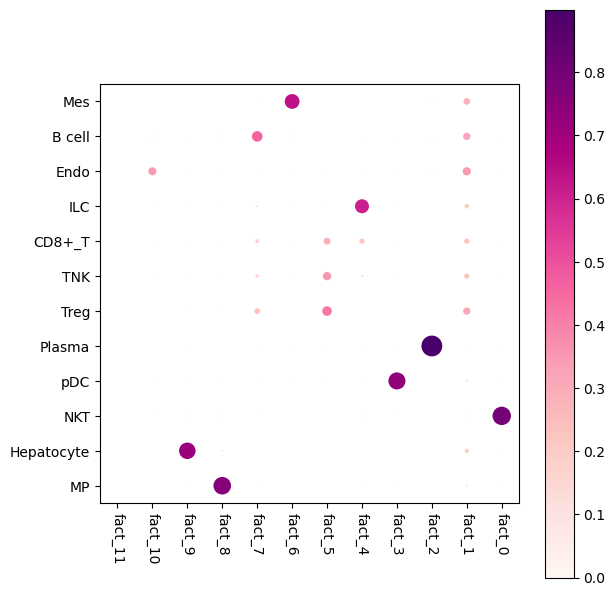

In [173]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact12']['mod'].plot_cell_type_loadings()

## 7.3 Estimate cell-type specific expression of every gene in the spatial data (needed for NCEM)
The cell-type specific expression of every gene at every spatial location in the spatial data enables learning cell communication with NCEM model using Visium data (https://github.com/theislab/ncem).

In [125]:
# Compute expected expression per cell type
expected_dict = mod.module.model.compute_expected_per_cell_type(
    mod.samples["post_sample_q05"], mod.adata_manager
)

# Add to anndata layers
for i, n in enumerate(mod.factor_names_):
    adata_spatial.layers[n] = expected_dict['mu'][i]

# Save anndata object with results
adata_file = f"{run_name}/sp_new_anno.h5ad"
adata_spatial.write(adata_file)
print(adata_file)

/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/r02_cell2location//cell2location_map/sp_new_anno.h5ad


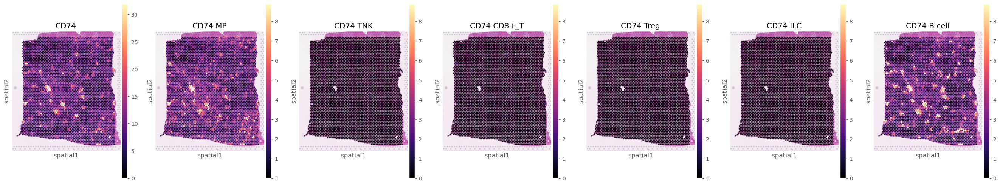

In [477]:
# list cell types and genes for plotting
ctypes = adata_ref.obs['final_celltype'].unique().tolist()[0:6]
genes = ['CD74']
sample = 'spaceranger_sample_C'

with mpl.rc_context({'axes.facecolor':  'black'}):
    # select one slide
    slide = select_slide(adata_spatial, sample)

    from utils.cell2loc_util import plot_genes_per_cell_type
    plot_genes_per_cell_type(slide, genes, ctypes);

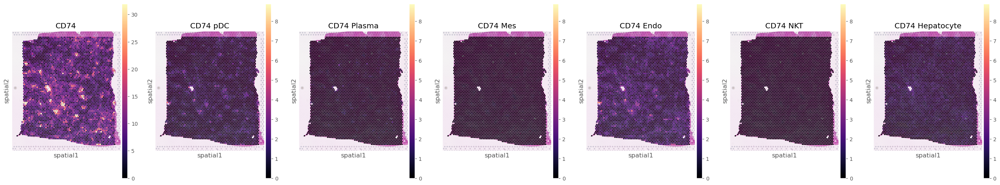

In [478]:
# list cell types and genes for plotting
ctypes = adata_ref.obs['final_celltype'].unique().tolist()[6:12]
genes = ['CD74']
sample = 'spaceranger_sample_C'

with mpl.rc_context({'axes.facecolor':  'black'}):
    # select one slide
    slide = select_slide(adata_spatial, sample)

    from utils.cell2loc_util import plot_genes_per_cell_type
    plot_genes_per_cell_type(slide, genes, ctypes);

In [126]:
def get_pivot_cell_clust_gene_df(sample, slide, cells):
    # get cell, cluster X mean expression matrix
    cell_clust_gene_list = [[] for i in range(4)]
    cell_clust_gene_df = pd.DataFrame()

    for clust in slide.obs['clusters'].cat.categories:
        for cell in cells:
            mean_val = slide[slide.obs['clusters'] == clust,:].layers[cell].mean(axis=0)
            cell_clust_gene_list[0].extend(mean_val.tolist()[0])
            cell_clust_gene_list[1].extend(slide.var['SYMBOL'].tolist())
            cell_clust_gene_list[2].extend([cell] * mean_val.shape[1])
            cell_clust_gene_list[3].extend([clust] * mean_val.shape[1])

    cell_clust_gene_df = pd.DataFrame(np.array(cell_clust_gene_list,dtype='object').T, \
                                      columns = ['expr','gene','cell','cluster'])
    pivot_cell_clust_gene_df = \
        cell_clust_gene_df.set_index(['gene', 'cell','cluster']).unstack().swaplevel(0,1,axis=1).sort_index(axis=1)
    return pivot_cell_clust_gene_df

In [127]:
def get_rank_gene_for_a_cluster(gene, clust, df):
    try:
        rank_cells = df.loc[gene,:].rank().sort_values((clust,'expr'),ascending=False).index.tolist()[:3]
        expr = df.loc[gene,:].loc[rank_cells,(clust,'expr')].tolist()
        expr = [str(round(e,2)) for e in expr]
    except:
        rank_cells = expr = []
    return pd.Series([','.join(rank_cells), ','.join(expr)])

In [128]:
# stetosis analysis
cells = adata_ref.obs['final_celltype'].unique().tolist()
sample = 'spaceranger_sample_C'
slide = select_slide(adata_spatial, sample)

steto_cell_clust_gene_df = get_pivot_cell_clust_gene_df(sample, slide, cells)

steto_fn = f'{raw_path}/steto_sene_VS_normal_spots_wilcoxon.tsv'
steto_df = pd.read_csv(steto_fn, sep='\t',header=0)
steto_df, _, _ = vis.get_sig_de_genes(steto_df, 'sene')
steto_df[['sene_cell_rank','sene_cell_rank_expr']] = \
      steto_df.apply(lambda row: get_rank_gene_for_a_cluster(row['sene_names'], '10', steto_cell_clust_gene_df), axis=1)

steto_df.to_csv(f'{raw_path}/sig_de_steto_sene_VS_normal_spots_wilcoxon.tsv',sep='\t',index=False)

In [129]:
# stetosis analysis
cells = adata_ref.obs['final_celltype'].unique().tolist()
sample = 'spaceranger_V12M15_110_A1'
slide = select_slide(adata_spatial, sample)

fibro_cell_clust_gene_df = get_pivot_cell_clust_gene_df(sample, slide, cells)

fibro_fn = f'{raw_path}/fibro_sene_VS_normal_spots_wilcoxon.tsv'
fibro_df = pd.read_csv(fibro_fn, sep='\t',header=0)
fibro_df, _, _ = vis.get_sig_de_genes(fibro_df, 'sene')

fibro_df[['sene_cell_rank','sene_cell_rank_expr']] = \
      fibro_df.apply(lambda row: get_rank_gene_for_a_cluster(row['sene_names'], '8', fibro_cell_clust_gene_df), axis=1)

fibro_df.to_csv(f'{raw_path}/sig_de_fibro_sene_VS_normal_spots_wilcoxon.tsv',sep='\t',index=False)

In [130]:
steto_cell_clust_gene_df.swaplevel(0).loc['B cell'].sort_values(('10','expr'),ascending=False).head(n=10)

cluster,10,2,3
,expr,expr,expr
gene,,,
IGKC,11.257056,3.038212,2.970543
CD74,7.456657,2.099686,1.90936
UBC,5.848835,2.092873,2.261763
HLA-DRA,5.026909,1.393957,0.978857
TMSB4X,5.01066,1.437812,0.694631
FTL,4.208768,2.808337,1.594556
UBA52,3.696802,1.250445,1.119126
HLA-DPB1,2.998988,0.763722,0.565809


In [131]:
fibro_cell_clust_gene_df.swaplevel(0).loc['B cell'].sort_values(('8','expr'),ascending=False).head(n=10)

cluster,0,10,5,8
,expr,expr,expr,expr
gene,,,,
IGKC,0.495099,5.505796,0.81016,3.704319
UBC,0.289678,8.741968,0.464953,2.277126
CD74,0.239858,9.528582,0.416212,1.329099
UBA52,0.159371,2.074423,0.286303,1.146803
HLA-DRA,0.165831,3.079582,0.285182,1.06822
FTL,0.231871,1.925677,0.483311,0.901407
EEF2,0.096123,0.70919,0.187505,0.889098
TMSB4X,0.090991,1.676204,0.151866,0.782012


In [132]:
adata_spatial.write(f'{work_path}/cell2loci.h5ad')

In [238]:
adata_spatial.obsm['means_cell_abundance_w_sf'].shape

(18045, 12)